# Weddell Sea example: Floe identification and tracking
This example demonstrates the IFT for a 300 km by 300 km image centered at 75.78 S, 39.1 W 


* Get landmask tiff (extract corner coords)
* Update list of passtimes
* Set up and export preprocessing, cloud masking
* Binarization + Floe splitting
* Tracking
* Saving data


In [1]:
using Pkg
Pkg.activate("ift_joss")

using IceFloeTracker
using Images
using DataFrames
using CairoMakie
using StatsBase


  Activating project at `~/Documents/research/manuscripts/ice_floe_tracker_joss/notebooks/ift_joss`


In [2]:
include("weddell_sea_example.jl")

dist_morph_split (generic function with 1 method)

In [3]:
dataloc = "../data/weddell_sea"
files = filter(r -> occursin("weddell", r), readdir(dataloc))
sort!(files)

8-element Vector{String}:
 "weddell-sea-300km.250m.2025-12-09.aqua"
 "weddell-sea-300km.250m.2025-12-09.terra"
 "weddell-sea-300km.250m.2025-12-10.aqua"
 "weddell-sea-300km.250m.2025-12-10.terra"
 "weddell-sea-300km.250m.2025-12-11.aqua"
 "weddell-sea-300km.250m.2025-12-11.terra"
 "weddell-sea-300km.250m.2025-12-12.aqua"
 "weddell-sea-300km.250m.2025-12-12.terra"

In [4]:
passtimes = [
    "2025-12-09 04:00", # aqua
    "2025-12-09 09:58", # terra
    "2025-12-10 03:01", # aqua
    "2025-12-10 08:59", # terra
    "2025-12-11 03:40", # aqua
    "2025-12-11 09:38", # terra
    "2025-12-12 02:40", # aqua
    "2025-12-12 08:40" # terra
    ]
using Dates
passtimes = Dates.DateTime.(passtimes, "yyyy-mm-dd HH:MM")

8-element Vector{DateTime}:
 2025-12-09T04:00:00
 2025-12-09T09:58:00
 2025-12-10T03:01:00
 2025-12-10T08:59:00
 2025-12-11T03:40:00
 2025-12-11T09:38:00
 2025-12-12T02:40:00
 2025-12-12T08:40:00

In [5]:
truecolor_imgs = load.(joinpath.(dataloc, files, "truecolor.tiff"))
falsecolor_imgs = load.(joinpath.(dataloc, files, "falsecolor.tiff"));

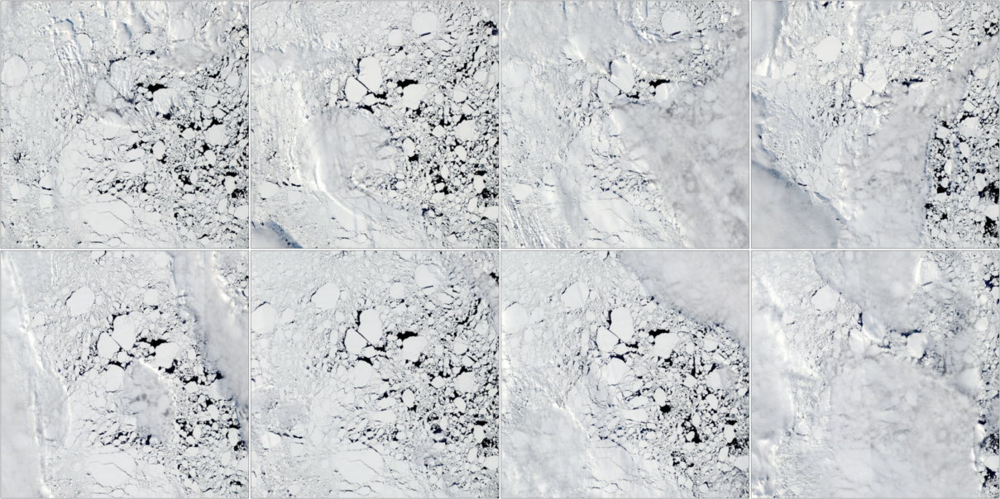

In [6]:
mosaicview(truecolor_imgs, nrow=2, npad=10)

In [20]:
land_masks = [zeros(Bool, size(truecolor_imgs[1])) for img in truecolor_imgs]
cloud_masks = Watkins2025CloudMask().(falsecolor_imgs)
proc_gray_imgs = Preprocess().(truecolor_imgs, land_masks, land_masks);
joint_masks = ((x, y) -> x .|| y).(land_masks, land_masks)
tc_masked = apply_landmask.(truecolor_imgs, joint_masks)
fc_masked = apply_landmask.(falsecolor_imgs, joint_masks)
prelim_ice = IceDetectionBrightnessPeaksMODIS134(band_1_min=0.3, nbins=128)
prelim_ice_masks = prelim_ice.(tc_masked);

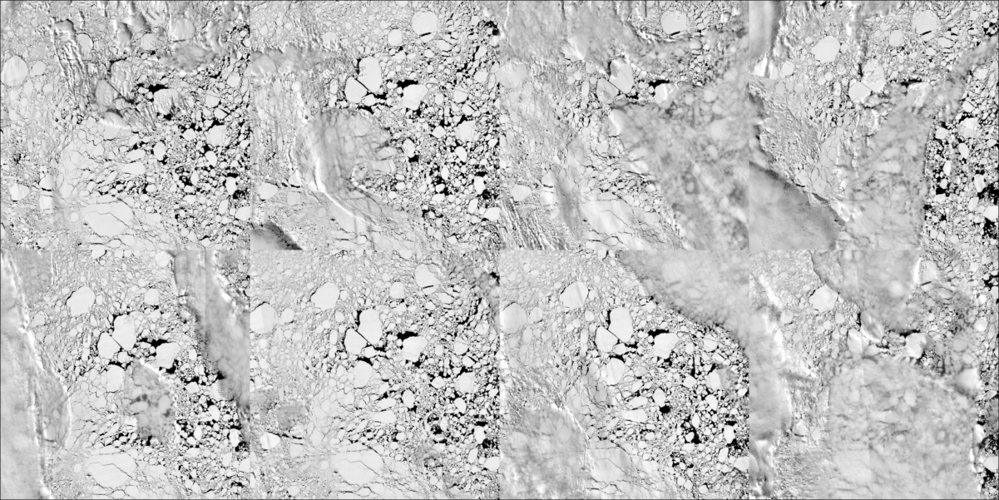

In [8]:
mosaicview(proc_gray_imgs, nrow=2)

In [9]:
k = 4
kmeans_result = kmeans_binarization.(
        proc_gray_imgs,
        fc_masked;
        k=k,
        maxiter=50,
        random_seed=45,
        cluster_selection_algorithm=IceDetectionBrightnessPeaksMODIS721(
            band_7_max=0.1, possible_ice_threshold=0.3, nbins=128, join_method="union"
            )
        );

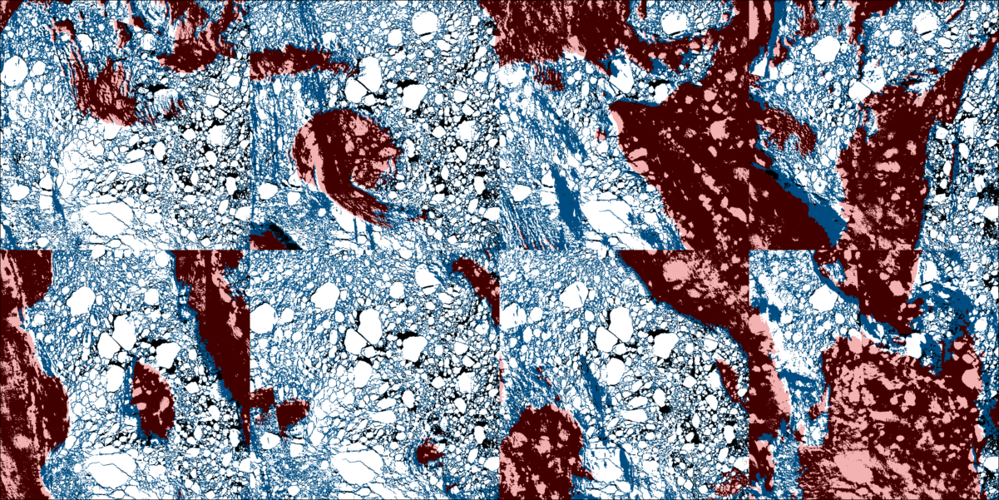

In [24]:
cloud_overlays = kmeans_result .|> r -> RGB.(r)
for idx in range(1, length(cloud_overlays))
    cloud_overlays[idx][cloud_masks[idx] .> 0] .= 0.7 .* cloud_overlays[idx][cloud_masks[idx] .> 0] 
    cloud_overlays[idx][cloud_masks[idx] .> 0] .= clamp01.(cloud_overlays[idx][cloud_masks[idx] .> 0] .+ 0.5 * RGB(0.5, 0, 0))

    other_ice = .!kmeans_result[idx] .&& prelim_ice_masks[idx] .&& .!cloud_masks[idx]
    cloud_overlays[idx][other_ice] .= clamp01.(cloud_overlays[idx][other_ice] .+ RGB(0, 0.3, 0.5))

end
mosaicview(cloud_overlays, nrow=2)

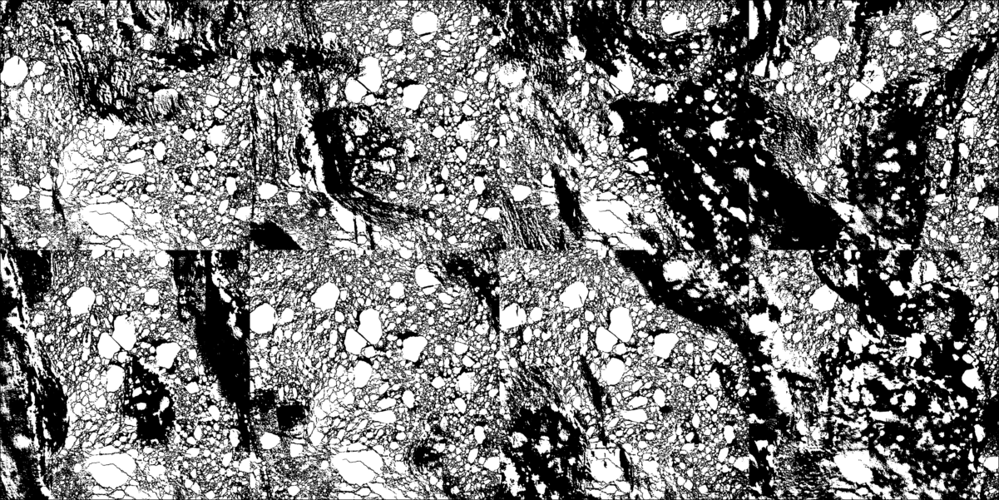

In [14]:
kmeans_cleaned = clean_binary_floes.(kmeans_result, prelim_ice_masks, cloud_masks)
mosaicview(kmeans_cleaned .|> r -> Gray.(r), nrow=2)

In [32]:
@time begin
    floes_distance = dist_morph_split.(kmeans_cleaned; max_distance=7);
    dist_overlay = [RGB.(Gray.(img)) for img in truecolor_imgs]
    for idx in range(1, length(truecolor_imgs))
        cview = view_seg_random(SegmentedImage(fc_masked[idx], floes_distance[idx]))
        dist_overlay[idx][floes_distance[idx] .> 0] .= cview[floes_distance[idx] .> 0]
    end
end
nothing

 13.048304 seconds (81.56 M allocations: 12.227 GiB, 21.18% gc time, 0.31% compilation time)


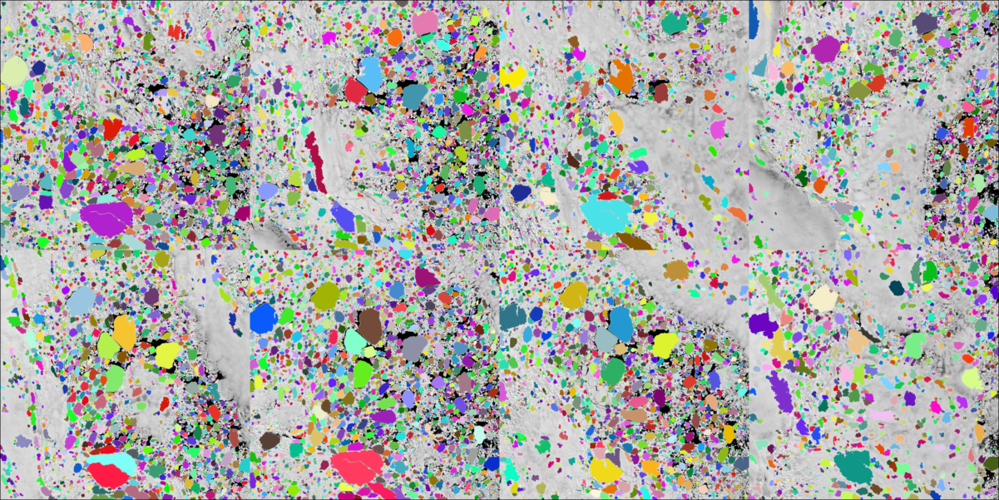

In [33]:
mosaicview(dist_overlay, nrow=2)

In [34]:
save("../figures/weddell_sea_split_floes_no_masking.png", mosaicview(dist_overlay, nrow=2))

  4.530624 seconds (80.64 M allocations: 4.414 GiB, 15.03% gc time)


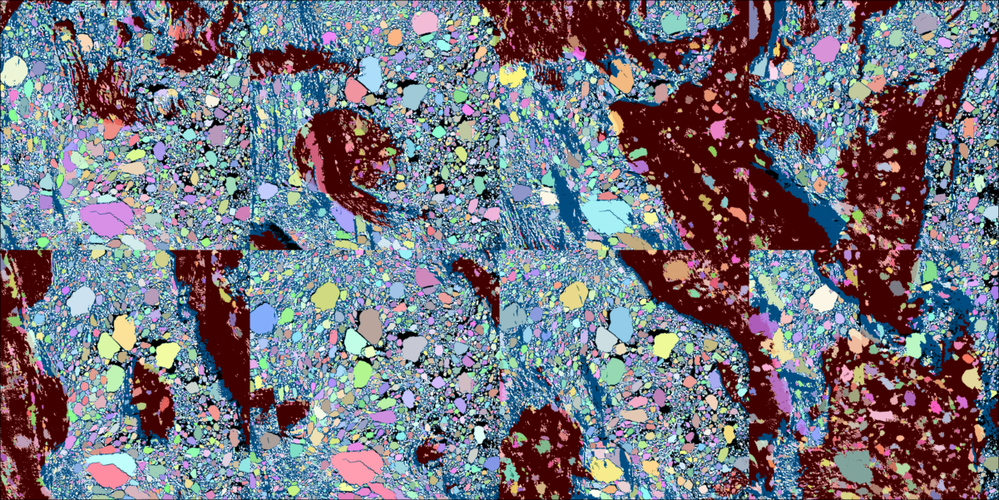

In [35]:
@time begin
    dist_overlay = deepcopy(cloud_overlays)
    for idx in range(1, length(dist_overlay))
        cview = view_seg_random(SegmentedImage(fc_masked[idx], floes_distance[idx]))
        dist_overlay[idx][floes_distance[idx] .> 0] .= 0.5 .* dist_overlay[idx][floes_distance[idx] .> 0] .+ 0.5 .* cview[floes_distance[idx] .> 0]
    end
end
save("../figures/weddell_colorized_classified.png", mosaicview(dist_overlay, nrow=2, npad=10, fillvalue=RGB(0)))
mosaicview(dist_overlay, nrow=2)

In [13]:
# save results
save.(joinpath.(dataloc, files, "cloud_mask.png"), cloud_masks .|> r -> Gray.(r))
save.(joinpath.(dataloc, files, "ice_mask.png"), prelim_ice_mask .|> r -> Gray.(r))
save.(joinpath.(dataloc, files, "segments.png"), floes_distance .|> r -> Gray.(r ./ maximum(r)))
save.(joinpath.(dataloc, files, "segments_overlay.png"), dist_overlay)
nothing

LoadError: UndefVarError: `floes_distance` not defined in `Main`
Suggestion: check for spelling errors or missing imports.

# Next steps
- Postprocess cleanup (cloud info, shape clarity, etc)
- Get passtimes
- Run tracker
- Visualize (at least, visualize by setting color for each floe so the color shows object tracking)
- Potentially clean up by checking for overlap with clouds

In [53]:
# Set up tracker function
# Each of these functions can be updated to include areas to connect to the piecewise linear functions.
filter_functions = ChainedFilterFunction(;
    filters = [DistanceThresholdFilter(
                    threshold_function = LopezAcostaTimeDistanceFunction(),
                    threshold_column = :time_distance_test,
                    scaling_function = dt -> IceFloeTracker.Tracking.maximum_linear_distance(dt; umax=0.75, eps=250)
            ),
        RelativeErrorThresholdFilter(variable=:area,
             threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.43, maximum_value=0.17)),
        RelativeErrorThresholdFilter(variable=:convex_area, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.44, maximum_value=0.25)),
        RelativeErrorThresholdFilter(variable=:major_axis_length, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.27, maximum_value=0.13)),
        RelativeErrorThresholdFilter(variable=:minor_axis_length, 
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.28, maximum_value=0.1)),
        ShapeDifferenceThresholdFilter(
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.47, maximum_value=0.31)),
        PsiSCorrelationThresholdFilter(
            threshold_function=PiecewiseLinearThresholdFunction(minimum_value=0.86, maximum_value=0.96))
        ])

ft = FloeTracker(filter_function=filter_functions,
    matching_function=MinimumWeightMatchingFunction(), minimum_area=300, maximum_area=50e3) # check that area is pixels.

FloeTracker(ChainedFilterFunction(IceFloeTracker.Tracking.AbstractFloeFilterFunction[DistanceThresholdFilter(:Δt, :Δx, :scaled_distance, LopezAcostaTimeDistanceFunction((Dates.Minute(20), Dates.Minute(90), Dates.Hour(24)), (3750.0, 7500.0, 30000.0, 60000.0)), :time_distance_test, var"#83#84"()), RelativeErrorThresholdFilter(:area, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.43, 0.17)), RelativeErrorThresholdFilter(:convex_area, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.44, 0.25)), RelativeErrorThresholdFilter(:major_axis_length, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.27, 0.13)), RelativeErrorThresholdFilter(:minor_axis_length, :area, :relative_error_test, PiecewiseLinearThresholdFunction(100, 700, 0.28, 0.1)), ShapeDifferenceThresholdFilter(:area, :area, :shape_difference_test, PiecewiseLinearThresholdFunction(100, 700, 0.47, 0.31)), PsiSCorrelationThresholdFilter(:area, :psi_s_correlation_

In [ ]:
# filtering?
@time begin 
    tracked = ft(floes_distance, passtimes)
end

In [66]:
satellites = [split(f, ".")[end] for f in files]
satellite_by_date = Dict(p => s for (p, s) in zip(passtimes, satellites))
ptimes = deepcopy(tracked[:, "passtime"])
tracked[:, "satellite"] = replace(ptimes, satellite_by_date...);

# Convert from Milliseconds to integers and put unit in column name
tracked[:, "dt_seconds"] = coalesce.(passmissing(r -> Float64(r.value/1e3)).(tracked.Δt), NaN);
tracked[:, "dx_meters"] = coalesce.(tracked.Δx, NaN)
tracked[:, "dxdt_mps"] = tracked[:, "dx_meters"] ./ tracked[:, "dt_seconds"]
# Save the result with the time indices
# Note that to merge these, we'll need to compare location matches to update the floe IDs.
save("../data/weddell_sea_results/weddell_sea_tracking_"*string(Date(first(passtimes)))*"_"*string(Date(last(passtimes)))*".csv", select(tracked, Not(:mask, :psi)))